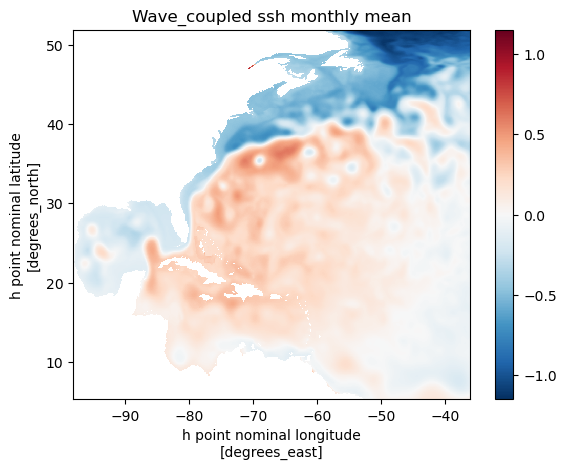

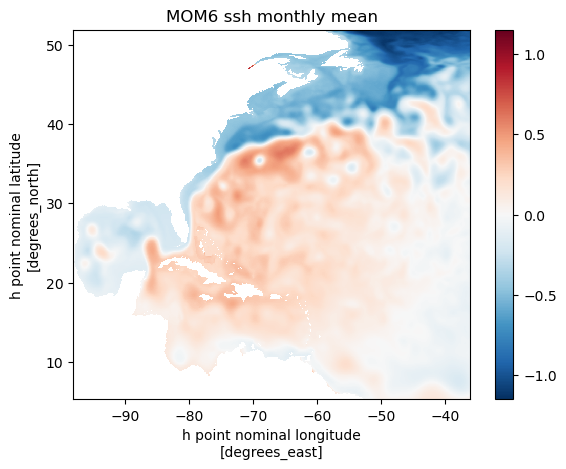

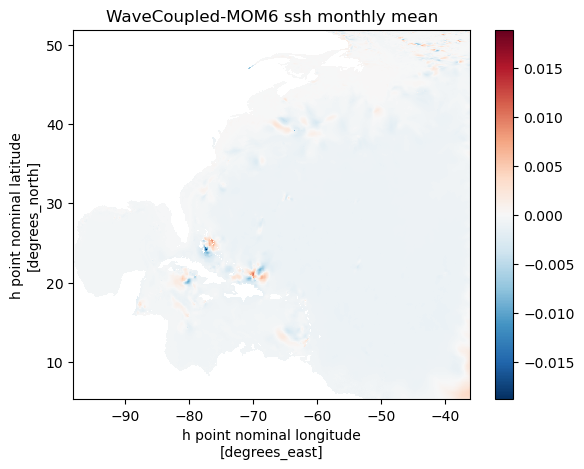

<xarray.IndexVariable 'xh' (xh: 775)>
array([-98.      , -97.920013, -97.839996, ..., -36.23999 , -36.160004,
       -36.079987])
Attributes:
    units:      degrees_east
    long_name:  h point nominal longitude
    axis:       X

In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import xarray
import numpy as np
import logging

# import numpy as np
# import netCDF4 as cdf
# d=cdf.Dataset('/archive/abs/SPEAR_old_wrong_code/OM4_1deg_coupled_ML/history/2014files/20140101.Vertical_coordinate.nc').variables
# Configure logging for ssh_eval
# logger = logging.getLogger(__name__)
# logging.basicConfig(filename="ssh_eval.log", format='%(asctime)s %(levelname)s:%(name)s: %(message)s',level=logging.INFO)


    # Ideally would use SSH, but some diag_tables only saved zos----for coupled waves
pp_root_wave="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALT_wave/"
ocean_daily_wave= xarray.open_dataset(pp_root_wave+"19930101.ocean_daily.nc")
ssh_wave=ocean_daily_wave.variables['ssh']
t_wave=ocean_daily_wave.variables['time']
model_grid_x = ocean_daily_wave.variables['xh']
model_grid_y = ocean_daily_wave.variables['yh']

ssh_wave_ave = ssh_wave.mean('time')
#nx_wave=ocean_daily_wave.variables['x']
dassh_wave_ave=xarray.DataArray(ssh_wave_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
dassh_wave_ave.plot()
plt.title('Wave_coupled ssh monthly mean')
#ocean_daily_wave
 # Ideally would use SSH, but some diag_tables only saved zos----for MOM stand alone

pp_root_uncou="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/"
ocean_daily= xarray.open_dataset(pp_root_uncou+"19930101.ocean_daily.nc")
ssh=ocean_daily.variables['ssh']
t=ocean_daily.variables['time']
ssh_ave = ssh.mean('time')
dassh_ave=xarray.DataArray(ssh_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
dassh_ave.plot()
plt.title('MOM6 ssh monthly mean')
plt.show()

###show the difference
diff_ssh_ave=ssh_wave_ave - ssh_ave
da_diff_ssh=xarray.DataArray(diff_ssh_ave, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
da_diff_ssh.plot()
plt.title('WaveCoupled-MOM6 ssh monthly mean')
plt.show()
model_grid_x
##make animation about the time

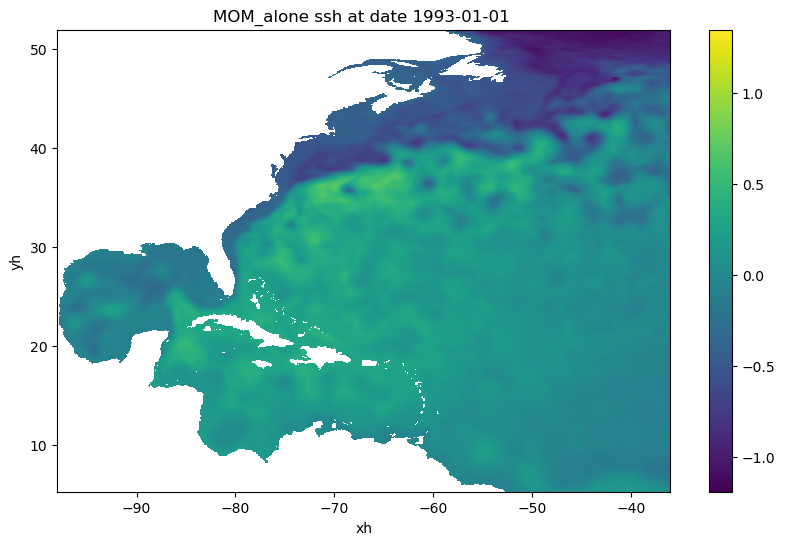

In [3]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.animation as animation
import pandas as pd

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_aspect('equal')
min=ssh.min()
max=ssh.max()
cax = ax.imshow(ssh[1,:,:], cmap='viridis',vmin=min,vmax=max)
cbar = fig.colorbar(cax)

def animate(i):
    ax.clear() 
    plths = ax.pcolormesh(model_grid_x,model_grid_y,ssh[i,:,:], vmin=min, vmax=max)

   
    plt.xlabel('xh'); plt.ylabel('yh');
    t=str(t_wave[i])
    index = t.split("'")[1]
    index=index.split("T")[0]
  

    plt.title(f"MOM_alone ssh at date {index} ")
    return plths,
    


ani = FuncAnimation(fig, animate, frames=len(t_wave), blit=False)

writergif = animation.PillowWriter(fps=30)
ani.save('MOMalone_ssh_ani.gif', writer=writergif)
HTML(ani.to_jshtml())


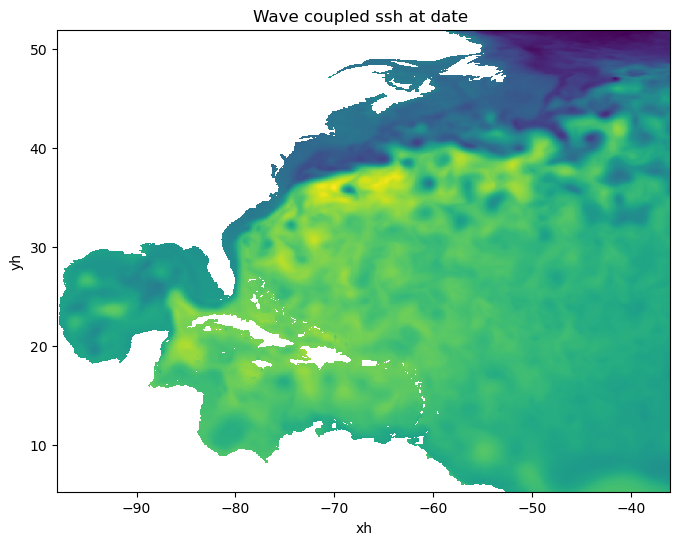

In [60]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.animation as animation
import pandas as pd

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_aspect('equal')


def animate(i):
    ax.clear() 
    plths = ax.pcolormesh(model_grid_x,model_grid_y,ssh_wave[i,:,:])
   
    plt.xlabel('xh'); plt.ylabel('yh');
   
    plt.title(f"Wave coupled ssh at date ")
    return plths,
    


ani = FuncAnimation(fig, animate, frames=len(t_wave), blit=False)

writergif = animation.PillowWriter(fps=30)
ani.save('WaveCoupled_ssh_ani.gif', writer=writergif)
HTML(ani.to_jshtml())

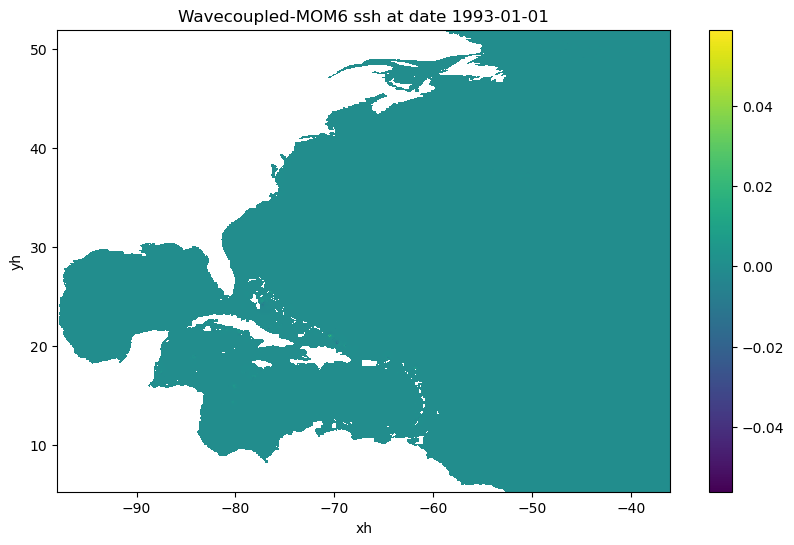

In [6]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib.animation as animation
import pandas as pd

fig, ax = plt.subplots(figsize=(10, 6))
ax.set_aspect('equal')

diff_ssh=ssh_wave-ssh
min=diff_ssh.min()
max=diff_ssh.max()
cax = ax.imshow(diff_ssh[1,:,:], cmap='viridis',vmin=min,vmax=max)
cbar = fig.colorbar(cax)

def animate(i):
    ax.clear() 
    
    plths = ax.pcolormesh(model_grid_x,model_grid_y,diff_ssh[i,:,:],vmin=min,vmax=max)
    t=str(t_wave[i])
    index = t.split("'")[1]
    index=index.split("T")[0]   
    plt.xlabel('xh'); plt.ylabel('yh');
   
    plt.title(f"Wavecoupled-MOM6 ssh at date {index}")
    return plths,
    


ani = FuncAnimation(fig, animate, frames=len(t_wave), blit=False)

writergif = animation.PillowWriter(fps=30)
ani.save('Wavecoupled-MOM6_ssh.gif', writer=writergif)
HTML(ani.to_jshtml())

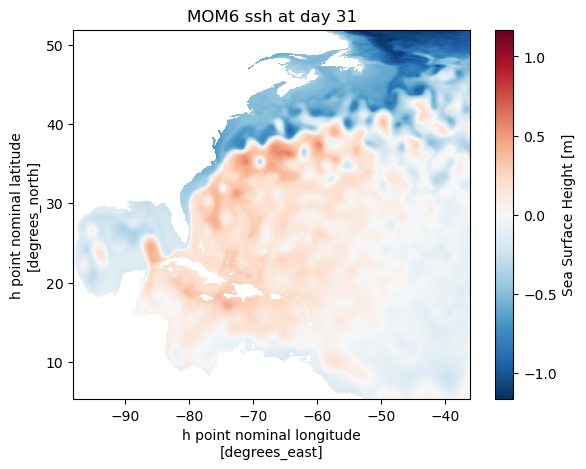

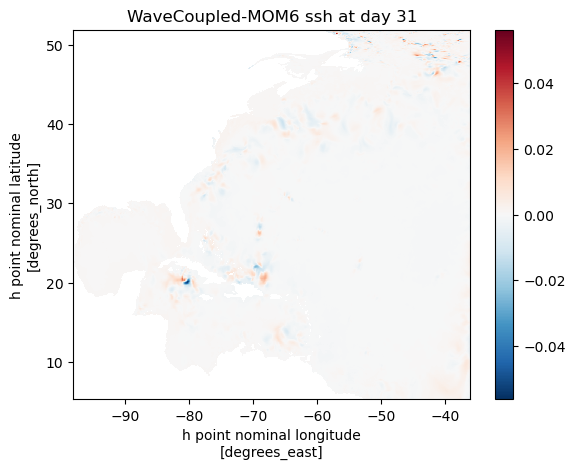

In [8]:
ssh_31 = ssh[30,:,:]
dassh_31=xarray.DataArray(ssh_31, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
dassh_31.plot()
plt.title('MOM6 ssh at day 31')
plt.show()

###show the difference
diff_ssh_31= ssh_wave[30,:,:] - ssh_31
da_diff_ssh=xarray.DataArray(diff_ssh_31, dims=['yh', 'xh'], coords={'xh': model_grid_x, 'yh': model_grid_y})
plt.figure()
da_diff_ssh.plot()
plt.title('WaveCoupled-MOM6 ssh at day 31')
plt.show()